# Alzheimer's Disease Data Analysis

## Setting up the notebook

Importing required packages

In [1]:
import math
import matplotlib as mpl
import matplotlib.dates as md
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import missingno as msno
import networkx as nx
import numpy as np
import os
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import re
import seaborn as sns
import sklearn as sk
import statsmodels.api as sm
import statsmodels.stats.outliers_influence as smo
import statsmodels.tools.tools as smt

from ipywidgets import Layout, widgets
from matplotlib.pyplot import figure
from mpl_toolkits import mplot3d
from patsy import dmatrices
from plotly.subplots import make_subplots
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA as skPCA
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.impute import KNNImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import logit
from statsmodels.regression.linear_model import OLS
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.features import PCA
from yellowbrick.style import set_palette

%config InlineBackend.figure_format='retina'
%matplotlib inline

plt.style.use('ggplot')
set_palette('sns_colorblind')

Setting seed for reproducibility

In [2]:
np.random.seed(0)

Setting the Working Directory

In [3]:
os.getcwd()

'C:\\Users\\vicks\\OneDrive\\Uni\\Postgraduate\\Semester 3\\Data Science Project\\Code'

In [4]:
os.chdir("C:\\Users\\vicks\\OneDrive\\Uni\\Postgraduate\\Semester 3\\Data Science Project\\Code")

Importing the Alzheimer’s Disease Data ("Identification of Altered Metabolic Pathways in Plasma and CSF in Mild Cognitive Impairment and Alzheimer’s Disease Using Metabolomics" - plasma dataset ST000046)

_The paper can be found here:_

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3658985/

_The data can be found here:_

https://www.metabolomicsworkbench.org/data/DRCCMetadata.php?Mode=Study&StudyID=ST000046

_Note that the title of the paper slightly varies between the two links and also when viewed in pdf format, however it has been established that despite the three different titles the paper remains the same._

In [5]:
AllAlzData = pd.read_csv("ADMSPositiveIonModeC18Data.csv")

## Data Cleaning and Pre-Processing

Checking the Contents of the Data

In [6]:
AllAlzData.head()

,Unnamed: 0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,Cog Status,AD,AD,AD,AD,AD,AD,AD,AD,AD,...,MCI,MCI,MCI,MCI,MCI,MCI,MCI,MCI,MCI,MCI
1,10_12_15-octadecatrienoicacid,5708,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,5779.5,NaN,NaN,NaN,NaN,NaN
2,(10E)-19-fluorovitaminD3/(10E)-19-fluorocholec...,104246.5,95465.5,73678.5,75403.5,81561,74686,81504.5,95432,104988,...,102571,101796.5,101673.5,104111.5,111947,90836.5,88508.5,88799.5,82764.5,86284.5
3,10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid,16676,18200.5,16881.5,15592.5,21389,18016,18909.5,24847.5,18525,...,21148,19778.5,23627.5,18912,14219.5,10525,14958.5,16778,15011.5,17550.5
4,10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2...,112810.5,107893,193570.5,191263,205534,240282.5,144019,75478,99881,...,100480.5,118857,107784.5,155987,126201.5,131937.5,291211.5,133207,145163.5,146789.5


Checking the Dimensions of the Data

_15 participants in each clinical group plus a column of metabolite names means expectation of 46 columns_

In [7]:
print(AllAlzData.shape)

(1910, 46)


Setting the Index

In [8]:
AlzData1 = AllAlzData.set_index("Unnamed: 0", drop = True)
AlzData1

,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,42,43,44,45
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
Cog Status,AD,AD,AD,AD,AD,AD,AD,AD,AD,AD,...,MCI,MCI,MCI,MCI,MCI,MCI,MCI,MCI,MCI,MCI
10_12_15-octadecatrienoicacid,5708,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4912,...,NaN,NaN,NaN,NaN,5779.5,NaN,NaN,NaN,NaN,NaN
(10E)-19-fluorovitaminD3/(10E)-19-fluorocholecalciferol,104246.5,95465.5,73678.5,75403.5,81561,74686,81504.5,95432,104988,97956,...,102571,101796.5,101673.5,104111.5,111947,90836.5,88508.5,88799.5,82764.5,86284.5
10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid,16676,18200.5,16881.5,15592.5,21389,18016,18909.5,24847.5,18525,23409.5,...,21148,19778.5,23627.5,18912,14219.5,10525,14958.5,16778,15011.5,17550.5
10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2059581,112810.5,107893,193570.5,191263,205534,240282.5,144019,75478,99881,108931.5,...,100480.5,118857,107784.5,155987,126201.5,131937.5,291211.5,133207,145163.5,146789.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))",196984,181384,138590,143266,133634,139323,131215,202552,204834,206278,...,211925,212150,212064,204278,199040,186013,183777,180060,161456,230818
GPIns(16:0/18:1(9Z)) + 14.261185,54724,14280,33774,12462,1,22408,15708,11221,73897,23573,...,9126,14056,13588,1,1,37045,5990,56645,22324,16108
GPIns(16:0/18:1(9Z)),22351,89378,26255,21538,31028,48121,21435,23359,29001,22892,...,25166,28009,22249,25784,22322,36478,25281,29455,44531,33574


Rotating the Data so that observations (samples) become the rows and features (metabolites) become the columns

In [9]:
AlzData = AlzData1.transpose()
AlzData;

Checking missing values

In [10]:
missing_values_count = AlzData.isnull().sum()
total_cells = np.product(AlzData.shape)

total_missing = missing_values_count.sum()
percent_missing = (total_missing/total_cells) * 100

print(percent_missing)

2.8807446189645143


Visualising missing value locations - by metabolite

In [11]:
print(AlzData.isnull().sum())

Unnamed: 0
Cog Status                                                  0
10_12_15-octadecatrienoicacid                              31
(10E)-19-fluorovitaminD3/(10E)-19-fluorocholecalciferol     0
10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid                  0
10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2059581        0
                                                           ..
GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))                     0
GPIns(16:0/18:1(9Z)) + 14.261185                            0
GPIns(16:0/18:1(9Z))                                        0
C22 Sulfatide                                               0
C24:1-OH Sulfatide                                          0
Length: 1910, dtype: int64


Checking Percentage Missing to eliminate any samples/metabolites with >70% missing values as per Lee and Styczynski (2018)

In [12]:
percent_missing = AlzData.isnull().sum() * 100 / len(AlzData)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print(missing_value_df)

                                           percent_missing
Unnamed: 0                                                
10_12_15-octadecatrienoicacid                    68.888889
D-Glucose                                        68.888889
Bis(2-hydroxypropyl)amine+5.6003766              60.000000
13S-hydroxy-9E_11Z-octadecadienoicacid           55.555556
epsilon-Caprolactam                              51.111111
...                                                    ...
L-Glutamic acid n-butyl ester + 1.4975796         0.000000
L-Glutamic acid n-butyl ester                     0.000000
C11 H9 N O3                                       0.000000
C11 H9 N O3 + 1.607376                            0.000000
C24:1-OH Sulfatide                                0.000000

[1910 rows x 1 columns]


In [13]:
percent_missing = AlzData1.isnull().sum() * 100 / len(AlzData1)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print(missing_value_df)

    percent_missing
17         4.502618
4          4.397906
29         3.821990
3          3.664921
7          3.664921
8          3.507853
39         3.507853
38         3.455497
14         3.455497
42         3.298429
2          3.193717
12         3.141361
25         3.141361
18         3.089005
22         2.931937
28         2.931937
11         2.931937
32         2.879581
20         2.879581
26         2.827225
37         2.827225
30         2.774869
41         2.774869
10         2.774869
6          2.774869
9          2.722513
1          2.722513
36         2.670157
35         2.670157
33         2.670157
45         2.670157
24         2.670157
21         2.617801
43         2.565445
27         2.513089
19         2.513089
16         2.460733
40         2.251309
44         2.251309
23         2.251309
15         2.198953
5          2.198953
34         2.146597
31         1.884817
13         1.832461


_According to Lee and Styczynski (2018) it is a common standard practice to remove any samples or metabolites with >70% missing values. In this dataset there are no samples or metablites missing values above the 70% threshold with the greatest quantity of missing values being from __sample 17__ and the metabolites __10_12_15-octadecatrienoicacid__ and __D-Glucose__._

Missingno Matrix Plot Visualizing the Sparsity of Data (excluding cognitive status column)

_Due to the dimensions of the dataset, this Matrix Plot is only readable with the data pre transposing_

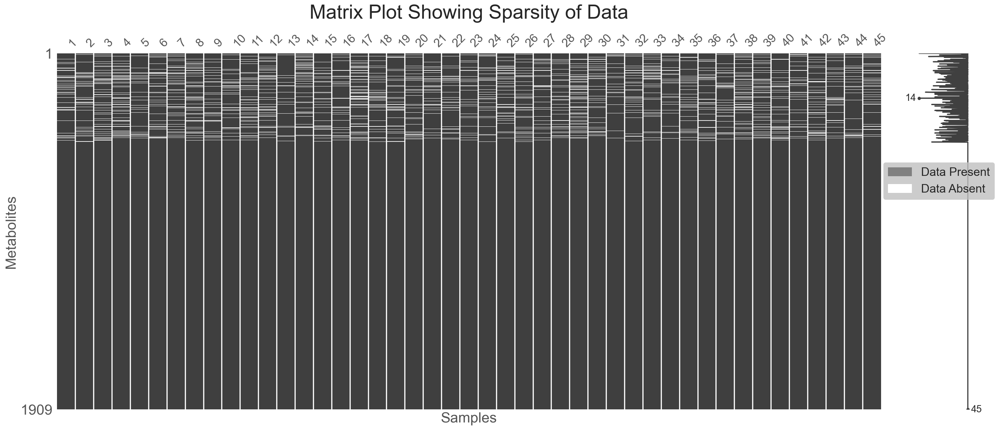

In [157]:
msno.matrix(AlzData.iloc[:,1:].T, fontsize=18)
gray_patch = mpatches.Patch(color='gray', label='Data Present')
white_patch = mpatches.Patch(color='white', label='Data Absent')
plt.legend(fontsize=18, bbox_to_anchor=(1.0, 0.7), borderaxespad=0.2, handles=[gray_patch, white_patch])
mpl.rcParams["legend.frameon"]=True
mpl.rcParams["legend.facecolor"]='#C0C0C0'
plt.title('Matrix Plot Showing Sparsity of Data', fontsize=30)
mpl.rcParams["axes.titlepad"]=20
plt.ylabel('Metabolites', fontsize=22)
plt.xlabel('Samples', fontsize=22)
plt.show()

Building a dendrogram to view relationships of missing values between samples (excluding cognitive status column)

_(Data also not transposed here for the purposes of visibility and size)_

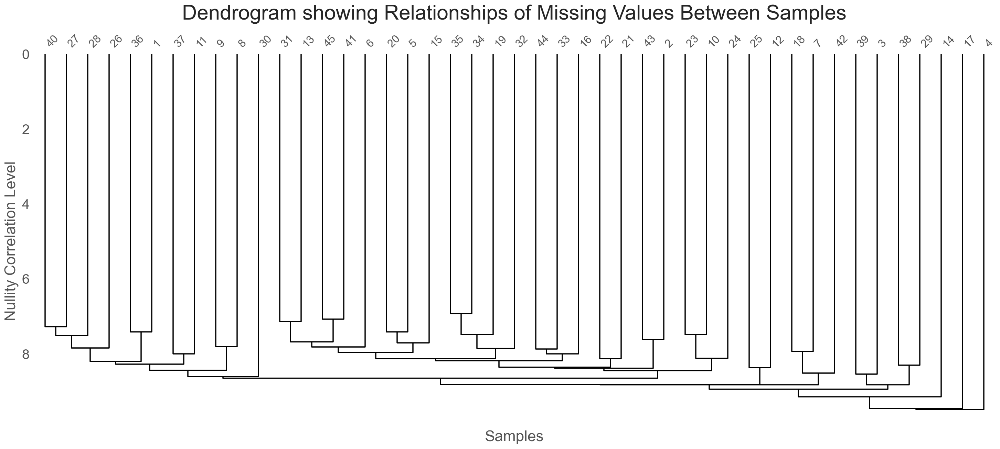

In [15]:
msno.dendrogram(AlzData.iloc[0:,1:].T)
plt.title('Dendrogram showing Relationships of Missing Values Between Samples', fontsize=30)
mpl.rcParams["axes.titlepad"]=20
plt.ylabel('Nullity Correlation Level', fontsize=22)
plt.xlabel('Samples', fontsize=22)
plt.show()

_The dendrogram does not show any samples linked together below level 6, which suggests that there are no samples which can be classed as 'very similar' and therefore likely to have a significant influence on each other_

### Imputation

Using NS-kNN Imputation _(Lee and Styczynski 2018)_ to resolve missing values

Converting the Data to Numeric

In [16]:
nAlzData = AlzData.iloc[0:,1:1910].astype(float)
nAlzData;

Separating out Cognitive Status Column to be added back after numeric processing

In [17]:
CogStat = AlzData.iloc[0:,0:1]
CogStat;

'Autoscaling' prior to Imputation

In [18]:
scalar = StandardScaler().fit(nAlzData)
AlzScSK = scalar.transform(nAlzData)
AlzScSK = pd.DataFrame(AlzScSK, columns=nAlzData.columns, index=nAlzData.index)
AlzScSK;

KNN Imputation Method

In [19]:
imputer = KNNImputer(n_neighbors=2)
After_imputation = imputer.fit_transform(AlzScSK)
AlzIm = pd.DataFrame(After_imputation, columns=AlzScSK.columns, index=AlzScSK.index)
AlzIm;

Un-scaling and then log transforming the data

In [20]:
AlzZunSc = scalar.inverse_transform(AlzIm)
AlzZunSc = pd.DataFrame(AlzZunSc, columns=nAlzData.columns, index=nAlzData.index)
AlzZ = np.log(AlzZunSc)
AlzZ;

Plot matrix to visualise the data during the various pre-processing stages

Text(0.5, 1.0, 'Log-Transformed, Clean Data')

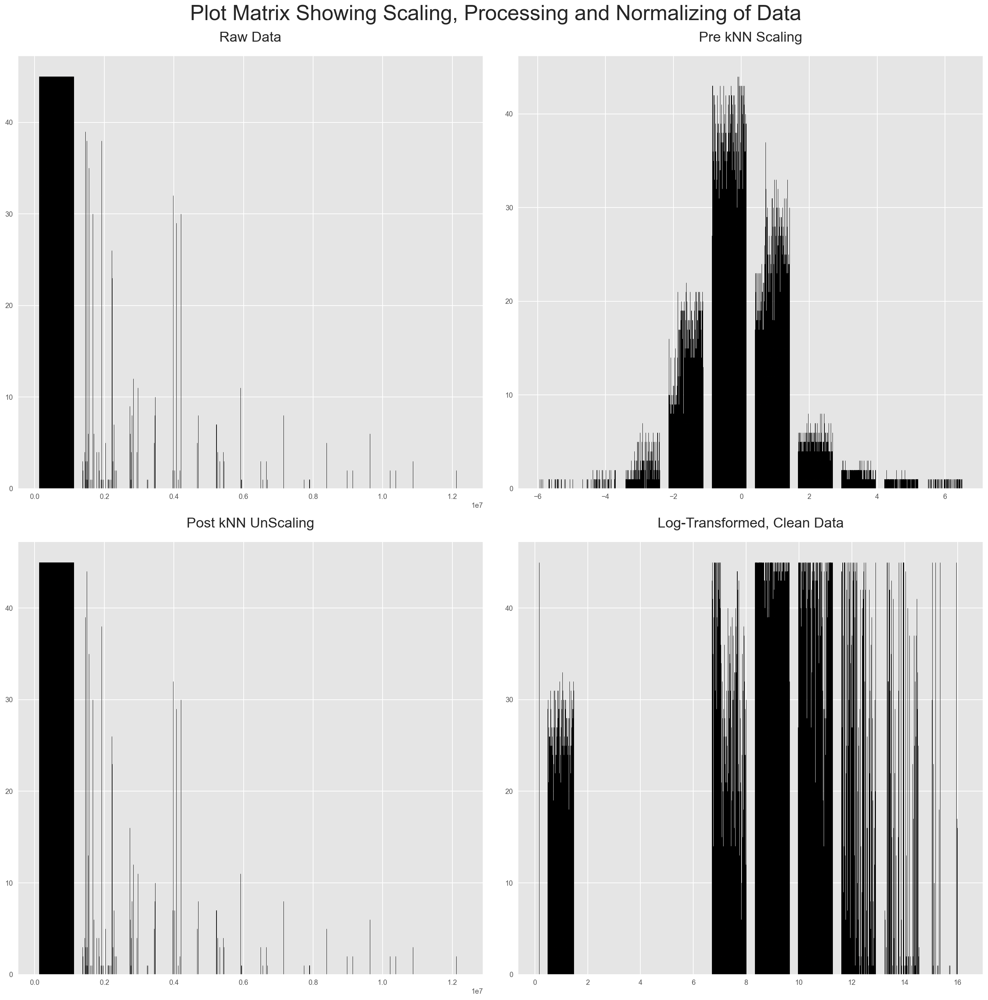

In [158]:
#Defining plot grids
fig, axs = plt.subplots(nrows=2, ncols=2)
fig.tight_layout(h_pad=3)
fig.suptitle('Plot Matrix Showing Scaling, Processing and Normalizing of Data', fontsize = 30)
plt.subplots_adjust(top=0.93)
plt.rcParams['figure.figsize'] = [20, 20]

#Histogram Creation
axs[0, 0].hist(nAlzData, edgecolor='black')
axs[0, 1].hist(AlzScSK, edgecolor='black')
axs[1, 0].hist(AlzZunSc, edgecolor='black')
axs[1, 1].hist(AlzZ, edgecolor='black')

#Assigning Histogram Titles
axs[0, 0].set_title('Raw Data', fontsize = 20)
axs[0, 1].set_title('Pre kNN Scaling', fontsize = 20)
axs[1, 0].set_title('Post kNN UnScaling', fontsize = 20)
axs[1, 1].set_title('Log-Transformed, Clean Data', fontsize = 20)

In [22]:
AlzZ.insert(0,'Cog_Status', CogStat)
AlzZ;

In [23]:
tAlzZ = AlzZ.T

In [24]:
new_header = tAlzZ.iloc[0]
tAlzZ = tAlzZ[1:]
tAlzZ.columns = new_header
tAlzZ;

Encoding the AD, MCI and CN values as labels

In [25]:
label_encoder = LabelEncoder()
AlzZ['Cog_Status'] = label_encoder.fit_transform(AlzZ['Cog_Status'])

Making a dictionary of metabolites

In [26]:
metabolites1 = AlzIm.columns.get_level_values('Unnamed: 0')
cogstats = AlzZ["Cog_Status"].values

In [27]:
metabolites1

Index(['10_12_15-octadecatrienoicacid',
       '(10E)-19-fluorovitaminD3/(10E)-19-fluorocholecalciferol',
       '10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid',
       '10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2059581',
       '1-(11E-octadecenoyl)-rac-glycerol', '11-deoxy-PGE2',
       '12-amino-dodecanoicacid',
       '12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid',
       '12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid+1.0063637',
       '12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid+1.175578',
       ...
       'Galalpha1-3Galbeta1-4[Fucalpha1-3]GlcNAcbeta-Sp', 'GPSer(16:0/20:0)',
       'Galabiosylceramide (d18:1/12:0)', 'GPIns(16:0/16:0)',
       'GPSer(17:0/20:4(5Z,8Z,11Z,14Z))',
       'GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))',
       'GPIns(16:0/18:1(9Z)) + 14.261185', 'GPIns(16:0/18:1(9Z))',
       'C22 Sulfatide', 'C24:1-OH Sulfatide'],
      dtype='object', name='Unnamed: 0', length=1909)

In [28]:
tempnames = list(range(1,1909+1))
tempnames = [int(d) for d in tempnames]

In [29]:
tempnamesdict = dict(zip(metabolites1, tempnames))

Creating a newly labelled dataset so the metabolite names don't interfere with the code

In [30]:
AlzZtmp = AlzZ.copy()

In [31]:
AlzZtmp.columns = AlzZtmp.columns.map(tempnamesdict)
AlzZtmp.iloc[0:,1:1910];

In [32]:
AlzZtmp.insert(0,'Cog_Status', CogStat)

In [33]:
AlzZtmp = AlzZtmp.drop(AlzZtmp.columns[[1]], axis=1)

In [34]:
AlzZtmp;

In [35]:
tAlzZtmp = AlzZtmp.T

Defining Independent Variables

In [36]:
ivar = AlzZtmp.iloc[0:,1:1910]
ivar = ivar
ivar.head()

Unnamed: 0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,...,1900.0,1901.0,1902.0,1903.0,1904.0,1905.0,1906.0,1907.0,1908.0,1909.0
1,8.649624,11.554514,9.721726,11.633465,10.959540,8.422663,7.609367,9.013656,11.509625,7.999343,...,0.000000,8.353968,12.125968,0.000000,12.018139,12.190878,1.091006e+01,10.014626,8.414052,10.796366
2,9.054709,11.466520,9.809204,11.588895,10.630372,8.560540,7.961370,9.499908,11.127778,11.058937,...,7.951559,8.355380,0.000000,9.029897,9.740145,12.108372,9.566615e+00,11.400630,0.000000,10.794276
3,9.680297,11.207466,9.733974,12.173397,10.843202,9.185689,7.886269,8.690810,11.460405,8.283620,...,8.042378,0.000000,11.654338,0.000000,0.000000,11.839275,1.042745e+01,10.175612,8.666647,10.515913
4,9.704427,11.230609,9.654545,12.161405,10.655917,9.189985,7.930746,9.152870,11.417196,8.404248,...,8.161375,0.000000,11.888378,0.000000,0.000000,11.872458,9.430439e+00,9.977574,8.265907,10.550015
5,9.680297,11.309106,9.970632,12.233367,9.963265,9.632695,7.819636,8.946310,11.242546,10.027385,...,8.101072,0.000000,11.288080,0.000000,12.323656,11.802860,-3.637979e-12,10.342645,0.000000,10.547838


In [37]:
tivar = ivar.T
tivar;

## Exploring the Data

### Testing for Multicollinearity

#### Visualising Multicollinearity

Creating a Correlation Matrix

In [38]:
ivarnmd = AlzZ.iloc[0:,1:1910]
cor = ivarnmd.corr()
cor

Unnamed: 0,10_12_15-octadecatrienoicacid,(10E)-19-fluorovitaminD3/(10E)-19-fluorocholecalciferol,10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid,10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2059581,1-(11E-octadecenoyl)-rac-glycerol,11-deoxy-PGE2,12-amino-dodecanoicacid,12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid,12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid+1.0063637,12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid+1.175578,...,Galalpha1-3Galbeta1-4[Fucalpha1-3]GlcNAcbeta-Sp,GPSer(16:0/20:0),Galabiosylceramide (d18:1/12:0),GPIns(16:0/16:0),"GPSer(17:0/20:4(5Z,8Z,11Z,14Z))","GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))",GPIns(16:0/18:1(9Z)) + 14.261185,GPIns(16:0/18:1(9Z)),C22 Sulfatide,C24:1-OH Sulfatide
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
10_12_15-octadecatrienoicacid,1.000000,-0.139837,-0.089677,0.331120,-0.119784,0.297949,0.178494,-0.111110,-0.018429,0.179106,...,0.124847,-0.229134,0.026765,-0.293136,-0.210735,-0.100365,-0.075118,-0.145468,0.029896,-0.155793
(10E)-19-fluorovitaminD3/(10E)-19-fluorocholecalciferol,-0.139837,1.000000,0.129815,-0.597797,0.151429,-0.626286,-0.568345,0.546601,0.578889,-0.084949,...,-0.289782,0.543785,-0.392601,0.319141,0.202704,0.871629,-0.214525,0.018287,0.040368,0.849839
10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid,-0.089677,0.129815,1.000000,-0.279675,0.037574,-0.188329,-0.248785,-0.059310,-0.151189,0.150589,...,-0.070355,0.370002,-0.287399,0.151526,0.246731,0.190137,-0.070217,-0.132273,0.049334,0.122780
10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2059581,0.331120,-0.597797,-0.279675,1.000000,-0.152801,0.860794,0.310430,-0.196935,-0.246762,0.043920,...,0.106049,-0.483341,0.256222,-0.218197,-0.009231,-0.542437,-0.136798,-0.012518,0.011752,-0.511310
1-(11E-octadecenoyl)-rac-glycerol,-0.119784,0.151429,0.037574,-0.152801,1.000000,-0.304050,-0.001173,0.077178,0.011016,-0.129274,...,-0.009628,0.103894,-0.000894,-0.014667,-0.223386,0.104284,0.075786,-0.034888,0.111803,0.087032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))",-0.100365,0.871629,0.190137,-0.542437,0.104284,-0.606138,-0.628903,0.551318,0.724621,-0.059022,...,-0.231635,0.618289,-0.266666,0.184302,0.191739,1.000000,-0.050048,0.098542,-0.018820,0.980881
GPIns(16:0/18:1(9Z)) + 14.261185,-0.075118,-0.214525,-0.070217,-0.136798,0.075786,-0.204481,0.067481,-0.111291,-0.097138,0.131008,...,0.224309,0.038490,0.355991,-0.053127,-0.051580,-0.050048,1.000000,0.076638,0.009418,-0.078736
GPIns(16:0/18:1(9Z)),-0.145468,0.018287,-0.132273,-0.012518,-0.034888,-0.027710,0.034058,0.527983,-0.114257,0.233004,...,-0.044689,0.147953,-0.128202,0.007721,0.096707,0.098542,0.076638,1.000000,-0.246869,0.177481


Building a clustermap

In [39]:
sns.clustermap(cor, cmap="bwr", figsize=(50,50), metric='euclidean', yticklabels=False).ax_col_dendrogram.set_title(
    'Euclidean Based Clustermap Showing Highly Correlated Metabolites', fontsize=50)

Text(0.5, 1.0, 'Euclidean Based Clustermap Showing Highly Correlated Metabolites')

Building an interactive network graph to narrow down the information based on the correlation value threshold

In [40]:
cog = tAlzZ.columns.get_level_values('Cog_Status')

In [41]:
colormapMCLN = {
    'AD': '#949494',  # Colourblind friendly grey
    'CN': '#0173b2',  # Colourblind friendly blue
    'MCI': '#cc78bc',  # Colourblind friendly pink
}

In [42]:
colorlistMCLN = [colormapMCLN[c] for c in tAlzZ.columns.get_level_values('Cog_Status')]

In [43]:
threshold_choice = widgets.FloatSlider(description="Correlation Threshold", value=0.8, min=0.1, max=1, step=0.05, 
                                    continuous_update=False, orientation='horizontal', layout=Layout(width='500px'), 
                                    style=dict(description_width= 'initial'))

network = go.FigureWidget(data=[go.Scatter(x=[], y=[], mode='lines', text=[],  line=dict(color='#cc78bc', width=2.5), 
                                    marker=dict(size=16, line_width=5,line=dict(color='#cc78bc',width=2))),
                                    go.Scatter(x=[], y=[],mode='markers+text', textposition="top center", text=[], 
                                    hoverinfo='text',textfont_size=12, marker=dict(size=10, color=[],line_width=1))],
                                    layout=go.Layout(showlegend=False, annotations=[], margin=dict(t=40, b=0, l=0, r=0), 
                                    width=950, height=800, title='Network Graph Showing Correlated Metabolites at Adjustable Correlation Thresholds')) 
                          
df = AlzZ.copy()
correlation_matrix = cor.to_numpy()

def plot_corr_graph(change):

    threshold, corr_mode = None, None
    threshold = change.new
    
    tr_ind = np.triu_indices(correlation_matrix.shape[0])
    correlation_matrix[tr_ind] = 0
    G = nx.from_numpy_matrix(correlation_matrix)
    G = nx.relabel_nodes(G, lambda x: df.columns.tolist()[x])
    
    remove = []
    
    for col1, col2, weight in G.edges(data=True):
      if math.isnan(weight["weight"]):
        remove.append((col1,col2))
    
      if abs(weight["weight"]) < threshold:
        remove.append((col1,col2))
    
    G.remove_edges_from(remove)
    
    remove = []
    edges = list(sum(G.edges, ()))
    
    for node in G.nodes:
      if node not in edges:
        remove.append(node)
    G.remove_nodes_from(remove)
    mst = nx.maximum_spanning_tree(G)
    
    def assign_color(col):
      return colorlistMCLN

    def assign_color_edge(correlation):
      if correlation < 0:
        return "#BF0603"
      else:
        return "#00CC66"
    edge_colors = []
    node_colors = []
    for key, value in nx.get_edge_attributes(mst, 'weight').items():
        edge_colors.append(assign_color_edge(value))
    for key, value in dict(mst.degree).items():
        node_colors.append(assign_color(key))
      
    labels = {n:n for n in mst.nodes()}
    node_x = []
    node_y = []
    
    tree = nx.fruchterman_reingold_layout(mst, k=0.25).items()
    
    for node, (x_,y_) in tree:
        node_x.append(x_)
        node_y.append(y_)
        
    def get_dim_of_node(name):
        for node, (x,y) in tree:
            if node == name:
                return x,y
        
    edge_x = []
    edge_y = []
    
    weights= []
    for node1, node2, w in mst.edges(data=True):
        x0, y0 = get_dim_of_node(node1)
        x1, y1 =  get_dim_of_node(node2)
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
        weights.append((round(w["weight"],1), (x0+x1)/2, (y0+y1)/2))
                              
    with network.batch_update():
        network.data[1].x = node_x
        network.data[1].y = node_y
        network.data[1].text = list(labels)
        network.data[1].marker.color = node_colors
                          
        network.data[0].x = edge_x
        network.data[0].y = edge_y
        network.data[0].text = list(weights)
        network.update_layout(xaxis_zeroline=False, yaxis_zeroline=False, xaxis_showgrid=False, yaxis_showgrid=False, 
                              plot_bgcolor='rgba(0,0,0,0)')

threshold_choice.observe(plot_corr_graph, names="value")
widgets.VBox([threshold_choice, network])

_Recommended threshold 0.95_

#### Variance Inflation Factor (VIF) test

_Low to zero levels means this data would be a suitable candidate for Logistic Regression a method recommended by Lee and Hu (2019) and matching studies by Proitsi et al (2016) and Trushina et al (2013)_

Adding a constant

In [44]:
ivarc = smt.add_constant(data=ivarnmd, prepend=False)

Calculating VIF for each feature

In [45]:
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(ivarnmd.values, i) for i in range(ivarnmd.shape[1])]
vif_info['Column'] = ivarnmd.columns
vif_info.sort_values('VIF', ascending=False)

C:\Users\vicks\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



,VIF,Column
0,inf,10_12_15-octadecatrienoicacid
1269,inf,C6 H2 Cl2 N2 O S5
1281,inf,Desmethylthioridazine
1280,inf,C8 H4 O12 S2
1279,inf,C20 H37 N O4 + 11.435072
...,...,...
632,inf,Triparanol + 1.1419423
631,inf,C10 H9 N
630,inf,C6 H6 O4
629,inf,C5 H6 N2 O S


### Principle Component Analysis (PCA)

__PCA analysis should only include the features (i.e. metabolites) category labels (such as Cognitive Status) are not included in the analysis - however they can be used to colour code visualisations.__

Using the Sklearn package to perform the PCA so that we can extract numerical attributes of the model

In [46]:
skpca = skPCA(n_components=45, random_state = 2020)
skpca.fit(ivar)
skAlzZpca = skpca.transform(ivar)

Using Yellowbrick to perform PCA to produce a visualisation of the components by cognitive type

_It is clear that there are no separate clusters between the cognitive types - this matches other metabolomics for AD studies_

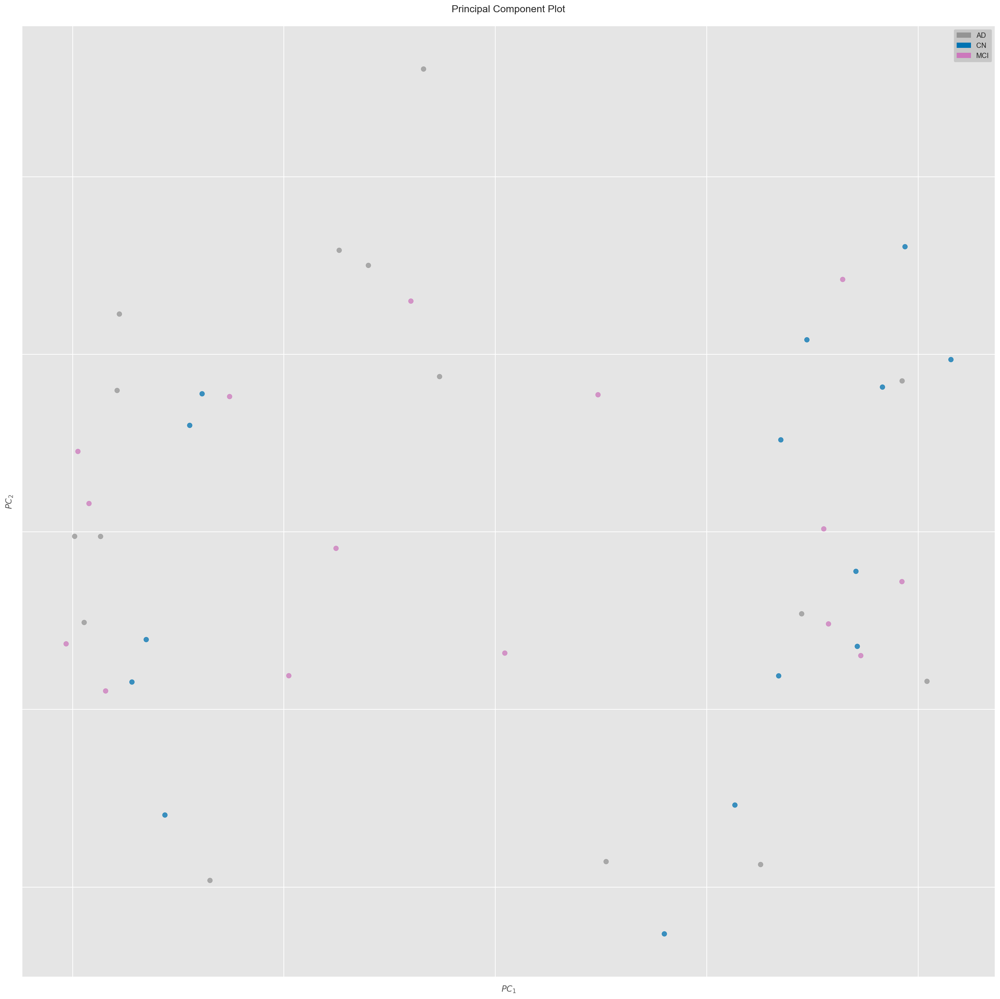

<AxesSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [47]:
AlzZpcavs = PCA(random_state = 2020, 
                classes = ['AD','CN','MCI'], colors=['#949494', '#0173b2', '#cc78bc'])
AlzZpcavs.fit_transform(ivar, AlzZ.Cog_Status)
AlzZpcavs.show()

Checking that the percentage variance of the data is completely explained by all of the principal components

In [48]:
print("Variance explained by all 45 principle components =", 
     sum(skpca.explained_variance_ratio_*100))

Variance explained by all 45 principle components = 100.00000000000001


Checking total variance explained by each of the selected components

In [49]:
np.cumsum(skpca.explained_variance_ratio_*100)

array([  7.90629723,  13.71912019,  19.00385706,  22.6426648 ,
        26.13815827,  29.37428789,  32.35802594,  35.2252571 ,
        38.07400303,  40.85139552,  43.50466948,  46.04216123,
        48.51590447,  50.9490239 ,  53.30244687,  55.53136476,
        57.72116941,  59.80828296,  61.85030166,  63.87995374,
        65.87098302,  67.80544723,  69.69255137,  71.54845747,
        73.33478257,  75.05706904,  76.74891342,  78.41401802,
        80.04380201,  81.64119191,  83.21544003,  84.70888366,
        86.18371423,  87.6183755 ,  89.01765047,  90.41303908,
        91.75095841,  93.04401289,  94.2986628 ,  95.52718061,
        96.73051581,  97.83642707,  98.93400441, 100.        ,
       100.        ])

Visualising the explained variance by principal component using and elbow plot

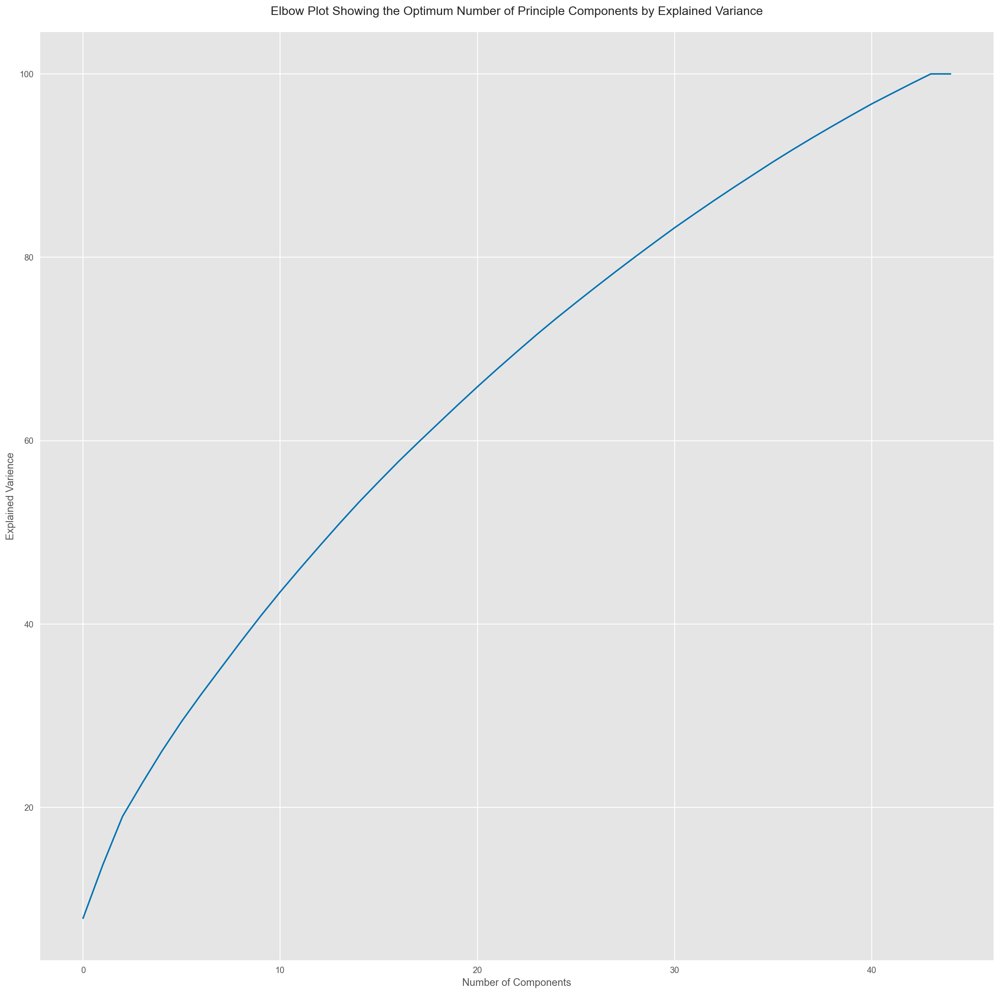

In [50]:
plt.plot(np.cumsum(skpca.explained_variance_ratio_*100))
plt.xlabel('Number of Components')
plt.ylabel('Explained Varience')
plt.title('Elbow Plot Showing the Optimum Number of Principle Components by Explained Variance')
plt.savefig('elbowplot.png', dpi=100)

Checking numerical values of explained variance by principal component

_A large number of principle components (40 of 45) are still needed to explain 95% of the variance)_

In [51]:
print("Varience explained by the First principle component =",
      np.cumsum(skpca.explained_variance_ratio_*100)[0])

print("Varience explained by the First 10 principle components =",
      np.cumsum(skpca.explained_variance_ratio_*100)[9])

print("Varience explained by the First 30 principle components =",
      np.cumsum(skpca.explained_variance_ratio_*100)[29])

print("Varience explained by the First 40 principle components =",
      np.cumsum(skpca.explained_variance_ratio_*100)[39])

Varience explained by the First principle component = 7.90629722874894
Varience explained by the First 10 principle components = 40.85139551955209
Varience explained by the First 30 principle components = 81.64119191214168
Varience explained by the First 40 principle components = 95.52718060528913


Selection of 95% variance principal components

In [52]:
skpca_95 = skPCA(n_components=0.95, random_state = 2020)
skpca_95.fit(ivar)
skAlzZpca_95 = skpca_95.transform(ivar)

In [53]:
skAlzZpca_95.shape

(45, 40)

Visualisation of the newly transformed data

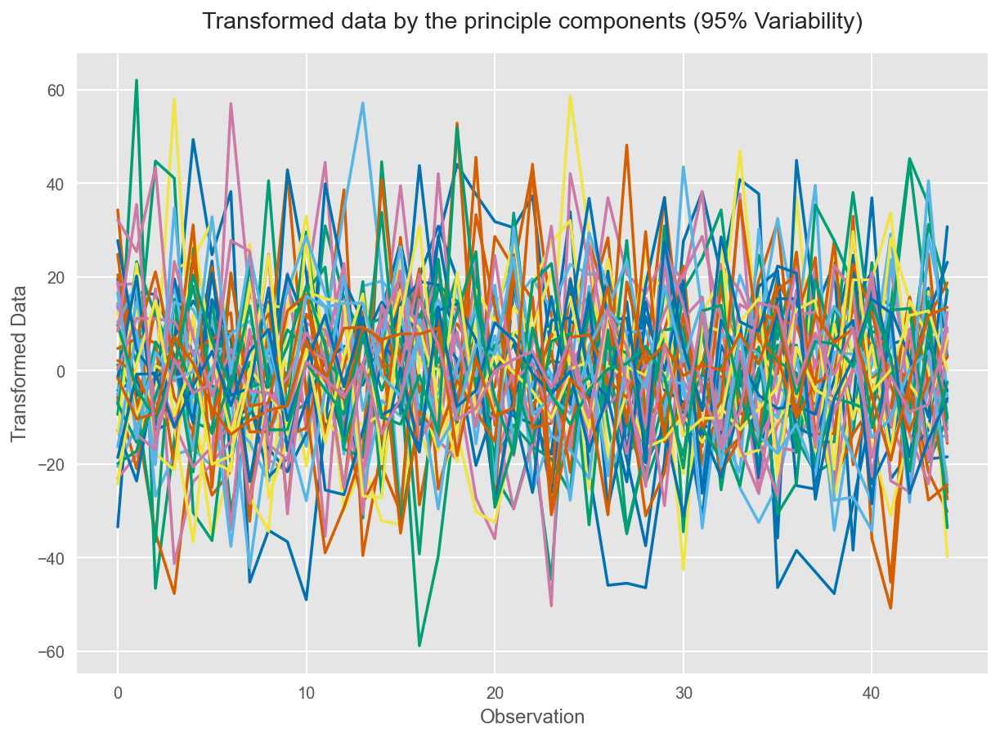

In [54]:
plt.figure(figsize=(10, 7))
plt.plot(skAlzZpca_95)
plt.xlabel('Observation')
plt.ylabel('Transformed Data')
plt.title('Transformed data by the principle components (95% Variability)', 
         pad = 15)
plt.savefig('plt.png')

Creating a new dataframe of the 95% variance explained principal components

In [55]:
b = 40
a = range(1, b + 1)
pcCol = ["PC" + str(i) for i in a]

In [56]:
pcadf = pd.DataFrame(skAlzZpca_95, columns = pcCol)
pcadf['label'] = AlzZ.Cog_Status
pcadf.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,label
0,-33.428326,-7.067907,34.338999,-23.032001,10.361089,13.607985,-4.242695,13.626862,-5.647494,14.377129,...,-19.873967,2.142715,18.851938,-24.104504,16.598579,-18.602752,9.724389,-1.623214,8.397424,NaN
1,16.765211,62.029902,-10.610059,-18.139754,-14.449931,17.211376,-1.812826,1.637634,-20.997444,-12.214771,...,-17.218743,-0.846769,-13.700939,1.348570,-14.567028,-0.808606,-3.968657,-10.345391,35.476461,NaN
2,16.260329,-46.548187,-34.749887,17.481118,-2.735714,-26.854625,-12.810337,44.751053,1.094649,-0.292664,...,-5.570283,-9.699227,-16.897615,14.965894,3.878225,-0.605492,-10.351656,-9.223064,-15.957978,NaN
3,6.057980,-14.947315,-47.677037,-41.262960,58.044184,-18.014842,-10.591708,41.101795,-1.898038,-11.018555,...,6.431860,-0.721929,23.336675,-9.700739,-1.681630,-12.125008,0.211868,7.237977,2.387618,NaN
4,49.366972,26.165902,-12.559481,-23.689582,-4.883749,-16.731295,-2.585965,-30.344712,-2.828898,9.157225,...,-3.687600,31.114573,7.180519,2.583676,-0.302113,-3.248407,20.392341,1.481507,-4.818237,NaN


Saving the new dataframe to a csv

In [57]:
pcadf = pcadf.iloc[0:,0:40]
pcadf.insert(0,'Cog Status', CogStat)
pcadf;

In [58]:
pcadf.to_csv('AD_95.csv', index=False)

In [59]:
tpcadf = pcadf.T
tpcadf;

In [60]:
new_header = tpcadf.iloc[0]
tpcadf = tpcadf[1:]
tpcadf.columns = CogStat
tpcadf;

### Partial Least Squares

#### Alzheimer's Disease against Cognitive Normal

Defining a dataset of specifically AD and CN data (Using the PCA 95% dataframe)

In [61]:
ADvsCN = tpcadf.iloc[1:,0:30]
ADvsCN;

Visually comparing the components by cognitive type

In [62]:
ADvsCN.columns.get_level_values(0)

Index([('AD',), ('AD',), ('AD',), ('AD',), ('AD',), ('AD',), ('AD',), ('AD',),
       ('AD',), ('AD',), ('AD',), ('AD',), ('AD',), ('AD',), ('AD',), ('CN',),
       ('CN',), ('CN',), ('CN',), ('CN',), ('CN',), ('CN',), ('CN',), ('CN',),
       ('CN',), ('CN',), ('CN',), ('CN',), ('CN',), ('CN',)],
      dtype='object')

In [63]:
#building a dictionary
colormap = {
    ('AD',): '#949494',  # Colourblind friendly grey
    ('CN',): '#0173b2',  # Colourblind friendly blue
}

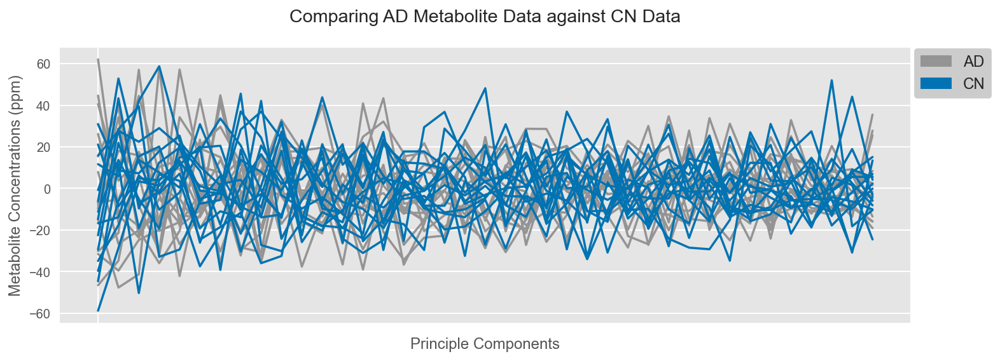

In [64]:
colorlist = [colormap[c] for c in ADvsCN.columns.get_level_values(0)]

ADCNfig = ADvsCN.plot(kind='line', legend=False, figsize=(12,4), color=colorlist, title='Comparing AD Metabolite Data against CN Data')
plt.xlabel('Principle Components')
plt.ylabel('Metabolite Concentrations (ppm)')
ADCNfig.xaxis.set_major_formatter(plt.NullFormatter())
plt.xticks(np.arange(0, 50, 50))
greydot = mpatches.Patch(color='#949494', label='AD')
bluedot = mpatches.Patch(color='#0173b2', label='CN')
plt.legend(fontsize=12, bbox_to_anchor=(1.0, 1.005), borderaxespad=0.2, handles=[greydot, bluedot])

_There does not seem to be any visually obvious outliers between the two groups although there are clear points on the right side of the plot where the CN data spikes higher._

Creating a pseudolinear Y value (using AD) against which to correlate the samples

In [65]:
y = [g == ('CN',) for g in ADvsCN.columns.get_level_values(0)]
y;

Conversion of boolean values to numerical

In [66]:
y = np.array(y, dtype=int)
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])

Apply fitting a PLS-DA model to the data

In [67]:
from sklearn.cross_decomposition import PLSRegression
plsr = PLSRegression(n_components=2, scale=False)
plsr.fit(ADvsCN.values.T, y)

PLSRegression(scale=False)

Viewing the model scores and building a dataframe to be used for plotting

(Scores describe the position of each sample in each determined latent variable (LV))

In [68]:
plsr.x_scores_;

In [69]:
plsr.x_weights_.shape

(39, 2)

In [70]:
scores = pd.DataFrame(plsr.x_scores_)
scores.index=ADvsCN.columns
scores;

Making a separate version of the scores dataframe which can be rounded to two significant figures for labelling the points without interfering in the plotting locations

In [71]:
scorelab = scores.round(decimals = 2)
scorelab;

Plotting the PLS Regression scores

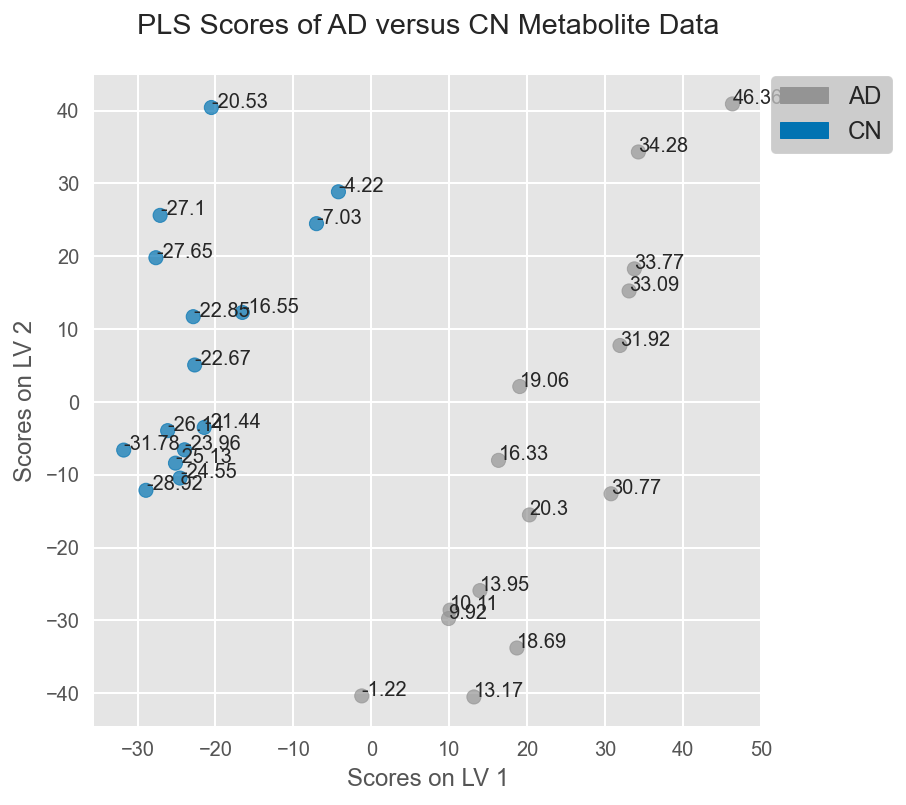

In [72]:
ax = scores.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7,
                    c=colorlist, figsize=(6,6))
ax.set_xlabel('Scores on LV 1')
ax.set_ylabel('Scores on LV 2')
ax.set_title('PLS Scores of AD versus CN Metabolite Data')

greydot = mpatches.Patch(color='#949494', label='AD')
bluedot = mpatches.Patch(color='#0173b2', label='CN')
plt.legend(fontsize=12, bbox_to_anchor=(1.2, 1.005), borderaxespad=0.2, handles=[greydot, bluedot])

for n, (x, y) in enumerate(scores.values):
    label = scorelab.values[n][0]
    ax.text(x,y,label)

_There is separation between AD and CN values on Latent Variable 1_

#### Mild Cognitive Impairment against Cognitive Normal

Defining a dataset of specifically MCI and CN data (Using the PCA 95% dataframe)

In [73]:
MCIvsCN = tpcadf.iloc[0:,15:]
MCIvsCN;

Visually comparing the components by cognitive type

In [74]:
MCIvsCN.columns.get_level_values(0)

Index([ ('CN',),  ('CN',),  ('CN',),  ('CN',),  ('CN',),  ('CN',),  ('CN',),
        ('CN',),  ('CN',),  ('CN',),  ('CN',),  ('CN',),  ('CN',),  ('CN',),
        ('CN',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',),
       ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',),
       ('MCI',), ('MCI',)],
      dtype='object')

In [75]:
#building a dictionary
colormap2 = {
    ('MCI',): '#cc78bc',  # Colourblind friendly pink
    ('CN',): '#0173b2',  # Colourblind friendly blue
}

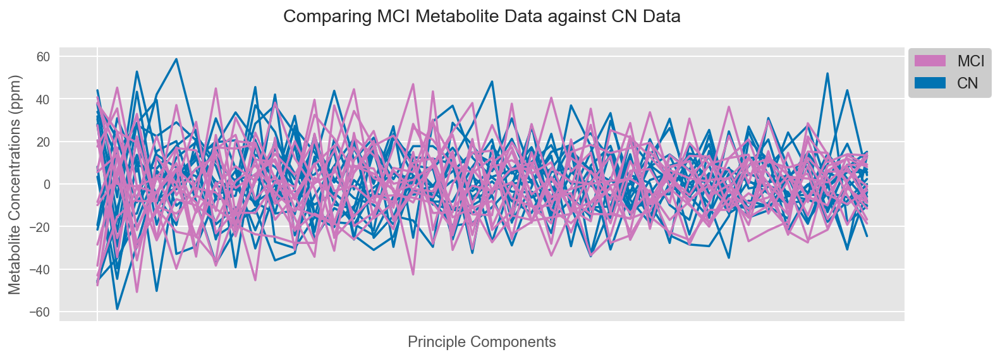

In [76]:
colorlist2 = [colormap2[c] for c in MCIvsCN.columns.get_level_values(0)]

MCICNfig = MCIvsCN.plot(kind='line', legend=False, figsize=(12,4), color=colorlist2, title='Comparing MCI Metabolite Data against CN Data')
plt.xlabel('Principle Components')
plt.ylabel('Metabolite Concentrations (ppm)')
MCICNfig.xaxis.set_major_formatter(plt.NullFormatter())
plt.xticks(np.arange(0, 50, 50))
pinkdot = mpatches.Patch(color='#cc78bc', label='MCI')
bluedot = mpatches.Patch(color='#0173b2', label='CN')
plt.legend(fontsize=12, bbox_to_anchor=(1.0, 1.005), borderaxespad=0.2, handles=[pinkdot, bluedot])

_There seems to be potential outliers in the CN data which can be seen by the large blue spike on the left hand side of the plot and the two blue spikes on the right hand side of the plot._

Creating a pseudolinear Y value (using AD) against which to correlate the samples

In [77]:
y2 = [g == ('CN',) for g in MCIvsCN.columns.get_level_values(0)]
y2;

Conversion of boolean values to numerical

In [78]:
y2 = np.array(y2, dtype=int)
y2

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

Apply fitting a PLS-DA model to the data

In [79]:
plsr2 = PLSRegression(n_components=2, scale=False)
plsr2.fit(MCIvsCN.values.T, y2)

PLSRegression(scale=False)

Viewing the model scores and building a dataframe to be used for plotting

In [80]:
plsr2.x_scores_;

In [81]:
plsr2.x_weights_.shape

(40, 2)

In [82]:
scores2 = pd.DataFrame(plsr2.x_scores_)
scores2.index=MCIvsCN.columns
scores2;

Making a separate version of the scores dataframe which can be rounded to two significant figures for labelling the points without interfering in the plotting locations

In [83]:
score2lab = scores2.round(decimals = 2)
score2lab;

Plotting the PLS Regression scores

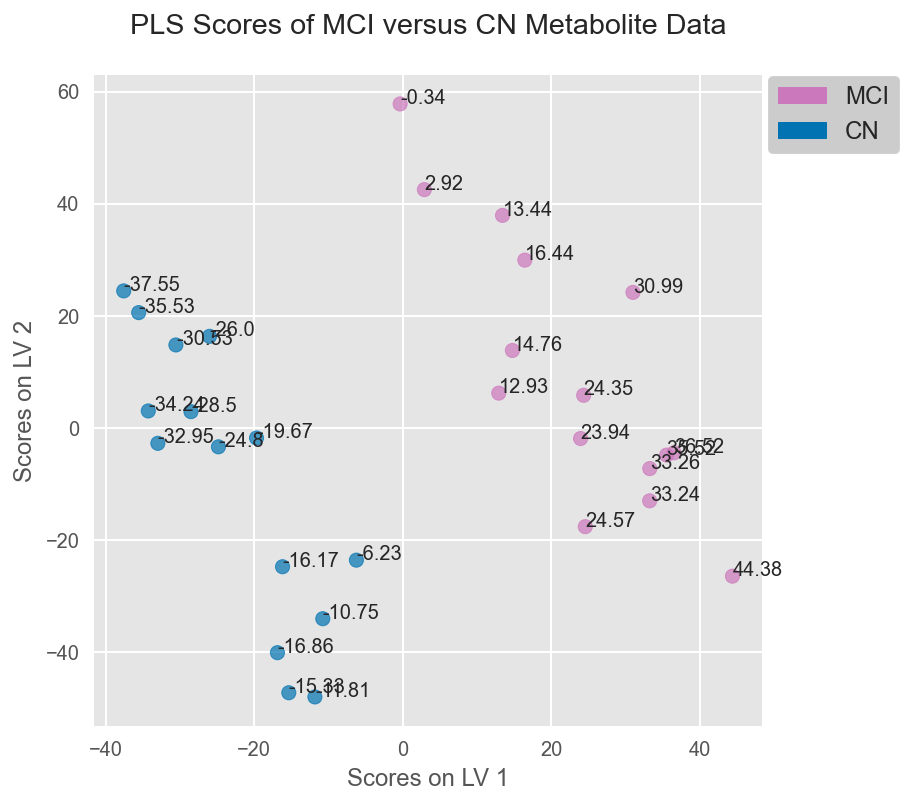

In [84]:
ax = scores2.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7,
                    c=colorlist2, figsize=(6,6))
ax.set_xlabel('Scores on LV 1')
ax.set_ylabel('Scores on LV 2')
ax.set_title('PLS Scores of MCI versus CN Metabolite Data')

pinkdot = mpatches.Patch(color='#cc78bc', label='MCI')
bluedot = mpatches.Patch(color='#0173b2', label='CN')
plt.legend(fontsize=12, bbox_to_anchor=(1.21, 1.005), borderaxespad=0.2, handles=[pinkdot, bluedot])

for n, (x, y) in enumerate(scores2.values):
    label = score2lab.values[n][0]
    ax.text(x,y,label)

_There appears to be separation between MCI and CN values on Latent Variable 1_

#### Alzheimer's Disease against Mild Cognitive Impairment

Defining a dataset of specifically AD and MCI data (Using the PCA 95% dataframe)

In [85]:
AD = tpcadf.iloc[0:,0:15]
AD;
MCI = tpcadf.iloc[0:,30:]
MCI;
ADvsMCI = AD.join(MCI)
ADvsMCI;

Visually comparing the components by cognitive type

In [86]:
ADvsMCI.columns.get_level_values(0)

Index([ ('AD',),  ('AD',),  ('AD',),  ('AD',),  ('AD',),  ('AD',),  ('AD',),
        ('AD',),  ('AD',),  ('AD',),  ('AD',),  ('AD',),  ('AD',),  ('AD',),
        ('AD',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',),
       ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',), ('MCI',),
       ('MCI',), ('MCI',)],
      dtype='object')

In [87]:
#building a dictionary
colormap3 = {
    ('MCI',): '#cc78bc',  # Colourblind friendly pink
    ('AD',): '#949494',  # Colourblind friendly grey
}

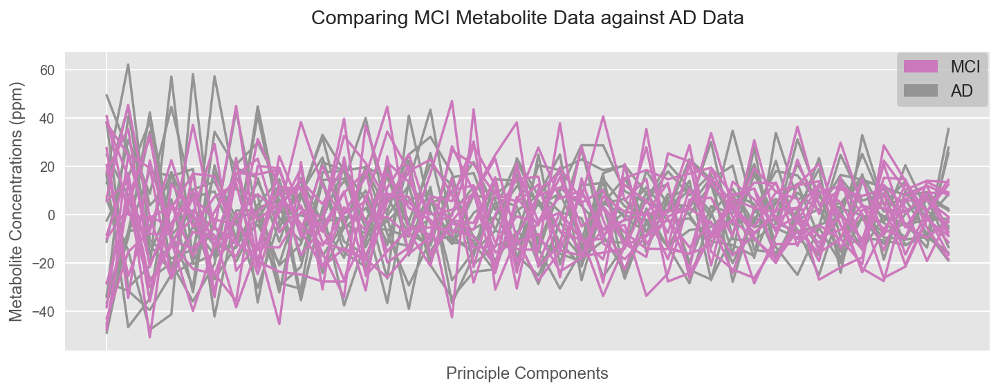

In [88]:
colorlist3 = [colormap3[c] for c in ADvsMCI.columns.get_level_values(0)]

MCIADfig = ADvsMCI.plot(kind='line', legend=False, figsize=(12,4), color=colorlist3, title='Comparing MCI Metabolite Data against AD Data')
plt.xlabel('Principle Components')
plt.ylabel('Metabolite Concentrations (ppm)')
MCIADfig.xaxis.set_major_formatter(plt.NullFormatter())
plt.xticks(np.arange(0, 50, 50))
pinkdot = mpatches.Patch(color='#cc78bc', label='MCI')
greydot = mpatches.Patch(color='#949494', label='AD')
plt.legend(fontsize=12, bbox_to_anchor=(1.0, 1.005), borderaxespad=0.2, handles=[pinkdot, greydot])

_There does appear to be some potential outliers in the AD data on the left side of the plot where the grey spikes higher._

Creating a pseudolinear y value (using AD) against which to correlate the samples

In [89]:
y3 = [g == ('AD',) for g in ADvsMCI.columns.get_level_values(0)]
y3;

Conversion of boolean values to numerical

In [90]:
y3 = np.array(y3, dtype=int)
y3

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

Apply fitting a PLS-DA model to the data

In [91]:
plsr3 = PLSRegression(n_components=2, scale=False)
plsr3.fit(ADvsMCI.values.T, y3)

PLSRegression(scale=False)

Viewing the model scores and building a dataframe to be used for plotting

In [92]:
plsr3.x_scores_;

In [93]:
plsr3.x_weights_.shape

(40, 2)

In [94]:
scores3 = pd.DataFrame(plsr3.x_scores_)
scores3.index=ADvsMCI.columns
scores3;

Making a separate version of the scores dataframe which can be rounded to two significant figures for labelling the points without interfering in the plotting locations

In [95]:
score3lab = scores3.round(decimals = 2)
score3lab;

Plotting the PLS Regression scores

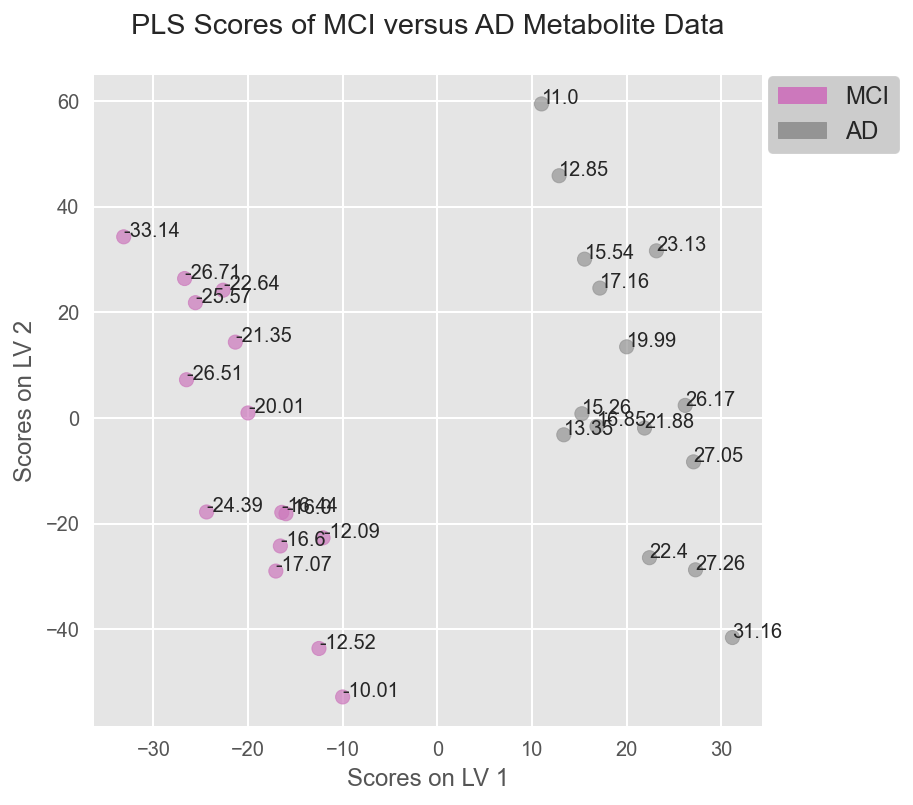

In [96]:
ax = scores3.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7,
                    c=colorlist3, figsize=(6,6))
ax.set_xlabel('Scores on LV 1')
ax.set_ylabel('Scores on LV 2')
ax.set_title('PLS Scores of MCI versus AD Metabolite Data')

pinkdot = mpatches.Patch(color='#cc78bc', label='MCI')
greydot = mpatches.Patch(color='#949494', label='AD')
plt.legend(fontsize=12, bbox_to_anchor=(1.21, 1.005), borderaxespad=0.2, handles=[pinkdot, greydot])

for n, (x, y) in enumerate(scores3.values):
    label = score3lab.values[n][0]
    ax.text(x,y,label)

_There appears to be significant separation between MCI and AD values on Latent Variable 1_

### Logistic Regression

#### AD vs CN

Creating a dataframe of only AD and CN Values

_1 values relate to AD and 0 values relate to CN_

In [97]:
AD_log = AlzZ.iloc[0:15,:]
AD_log.eval("Cog_Status = Cog_Status + 1", inplace=True)
AD_log;

In [98]:
CN_log = AlzZ.iloc[15:30,:]
CN_log.eval("Cog_Status = Cog_Status - 1", inplace=True)
CN_log;

In [99]:
ADvsCN_log = pd.concat([AD_log, CN_log])
ADvsCN_log

Unnamed: 0,Cog_Status,10_12_15-octadecatrienoicacid,(10E)-19-fluorovitaminD3/(10E)-19-fluorocholecalciferol,10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid,10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2059581,1-(11E-octadecenoyl)-rac-glycerol,11-deoxy-PGE2,12-amino-dodecanoicacid,12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid,12beta-Hydroxy-3-oxo-5beta-cholan-24-oicAcid+1.0063637,...,Galalpha1-3Galbeta1-4[Fucalpha1-3]GlcNAcbeta-Sp,GPSer(16:0/20:0),Galabiosylceramide (d18:1/12:0),GPIns(16:0/16:0),"GPSer(17:0/20:4(5Z,8Z,11Z,14Z))","GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))",GPIns(16:0/18:1(9Z)) + 14.261185,GPIns(16:0/18:1(9Z)),C22 Sulfatide,C24:1-OH Sulfatide
1,1,8.649624,11.554514,9.721726,11.633465,10.959540,8.422663,7.609367,9.013656,11.509625,...,0.000000,8.353968,12.125968,0.000000,12.018139,12.190878,1.091006e+01,10.014626,8.414052,10.796366
2,1,9.054709,11.466520,9.809204,11.588895,10.630372,8.560540,7.961370,9.499908,11.127778,...,7.951559,8.355380,0.000000,9.029897,9.740145,12.108372,9.566615e+00,11.400630,0.000000,10.794276
3,1,9.680297,11.207466,9.733974,12.173397,10.843202,9.185689,7.886269,8.690810,11.460405,...,8.042378,0.000000,11.654338,0.000000,0.000000,11.839275,1.042745e+01,10.175612,8.666647,10.515913
4,1,9.704427,11.230609,9.654545,12.161405,10.655917,9.189985,7.930746,9.152870,11.417196,...,8.161375,0.000000,11.888378,0.000000,0.000000,11.872458,9.430439e+00,9.977574,8.265907,10.550015
5,1,9.680297,11.309106,9.970632,12.233367,9.963265,9.632695,7.819636,8.946310,11.242546,...,8.101072,0.000000,11.288080,0.000000,12.323656,11.802860,-3.637979e-12,10.342645,0.000000,10.547838
6,1,9.680297,11.221048,9.799016,12.389571,9.910761,9.747126,7.955776,9.294590,11.423389,...,7.824446,0.000000,12.204952,0.000000,12.080713,11.844550,1.001717e+01,10.781474,8.638703,10.518889
7,1,9.680297,11.308414,9.847420,11.877701,10.100205,9.286004,7.956302,8.424310,11.373968,...,8.271548,0.000000,12.197087,0.000000,11.295801,11.784592,9.661925e+00,9.972780,8.597851,10.491691
8,1,8.764405,11.466169,10.120512,11.231597,10.512750,8.392197,7.840116,9.070101,11.491426,...,7.479300,8.557951,11.837571,10.312513,11.963708,12.218752,9.325542e+00,10.058738,8.370779,10.773818
9,1,9.029657,11.561601,9.826876,11.511735,10.247148,8.524268,7.845024,9.255505,11.595997,...,7.465083,8.419801,0.000000,8.679482,10.120492,12.229955,1.121043e+01,10.275086,8.482809,10.798943
10,1,8.499436,11.492274,10.060897,11.598475,10.068642,8.939122,7.820038,8.866158,11.556966,...,0.000000,8.637817,0.000000,8.491875,9.217912,12.236980,1.006786e+01,10.038543,8.419360,10.820778


Creating a features array

In [100]:
X1 = ADvsCN_log.iloc[:,1:]
X1;

Creating an output array

In [101]:
Y1 = ADvsCN_log.iloc[:,0]
Y1;

Splitting the data

In [102]:
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(X1, Y1, random_state=0)

Building the classifier

In [103]:
logclassifier1 = LogisticRegression(solver='lbfgs',random_state=0)

In [104]:
logclassifier1.fit(X_train1, Y_train1)

LogisticRegression(random_state=0)

Testing the classifier

In [105]:
predicted_y1 = logclassifier1.predict(X_test1)

In [106]:
predicted_y1

array([1, 1, 1, 1, 1, 0, 1, 1])

Testing the accuracy of the classifier

In [107]:
print('Accuracy: {:.2f}'.format(logclassifier1.score(X_test1, Y_test1)))

Accuracy: 0.62


Cross Validation testing

In [108]:
scores_log1 = cross_val_score(logclassifier1, X1, Y1, cv=10)
print('Cross-Validation Accuracy Scores', scores)

Cross-Validation Accuracy Scores                0          1
(AD,)  -1.222745 -40.377813
(AD,)  46.356504  40.916677
(AD,)  18.692658 -33.797747
(AD,)  30.774476 -12.619730
(AD,)  33.089205  15.232970
(AD,)  31.921989   7.744217
(AD,)   9.920566 -29.751866
(AD,)  10.112452 -28.599485
(AD,)  33.769038  18.265838
(AD,)  13.173233 -40.520193
(AD,)  16.330996  -8.029804
(AD,)  19.061220   2.108904
(AD,)  13.947946 -25.916051
(AD,)  20.300494 -15.522349
(AD,)  34.283022  34.320009
(CN,)  -7.033862  24.474461
(CN,) -25.130971  -8.409143
(CN,) -24.545581 -10.462321
(CN,) -21.443017  -3.508386
(CN,)  -4.216658  28.850970
(CN,) -23.963983  -6.578610
(CN,) -28.921526 -12.141890
(CN,) -26.137046  -3.950379
(CN,) -31.776560  -6.616078
(CN,) -16.546567  12.282010
(CN,) -27.103794  25.613816
(CN,) -22.851954  11.700331
(CN,) -22.666756   5.066427
(CN,) -27.646188  19.798676
(CN,) -20.526589  40.426541


In [109]:
scores_log1 = pd.Series(scores_log1)
scores_log1.min(), scores_log1.mean(), scores_log1.max()

(0.3333333333333333, 0.5666666666666667, 1.0)

_Range of accuracy is between 0.34 and 1.0 but averaging on 0.57_

Extracting coefficients of specific metabolites

In [110]:
# Create a list of original variable names from the training DataFrame
original_variables1 = X1.columns

# Extract the coefficients of the logistic regression estimator
model_coefficients1 = logclassifier1.coef_[0]

# Create a dataframe of the variables and coefficients & print it out
coefficient_df1 = pd.DataFrame({"Metabolite" : original_variables1, "Coefficient": model_coefficients1})
print(coefficient_df1)

# Print out the top 3 positive variables
top_three_df1 = coefficient_df1.sort_values(by="Coefficient", axis=0, ascending=False)[0:3]
print(top_three_df1)

# Print out the bottom 3 positive variables
bottom_three_df1 = coefficient_df1.sort_values(by="Coefficient", axis=0, ascending=True)[0:3]
print(bottom_three_df1)

                                             Metabolite  Coefficient
0                         10_12_15-octadecatrienoicacid    -0.001283
1     (10E)-19-fluorovitaminD3/(10E)-19-fluorocholec...     0.000594
2            10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid     0.000704
3     10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2...     0.000059
4                     1-(11E-octadecenoyl)-rac-glycerol     0.000499
...                                                 ...          ...
1904            GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))     0.000858
1905                   GPIns(16:0/18:1(9Z)) + 14.261185     0.007312
1906                               GPIns(16:0/18:1(9Z))     0.000751
1907                                      C22 Sulfatide    -0.000652
1908                                 C24:1-OH Sulfatide     0.000647

[1909 rows x 2 columns]
               Metabolite  Coefficient
621   p-Aminobenzoic acid     0.031606
1900     GPSer(16:0/20:0)     0.027982
1422          Lys Lys Met     

Feature Selection to improve the model

[0.0018 0.     0.     ... 0.     0.     0.    ]


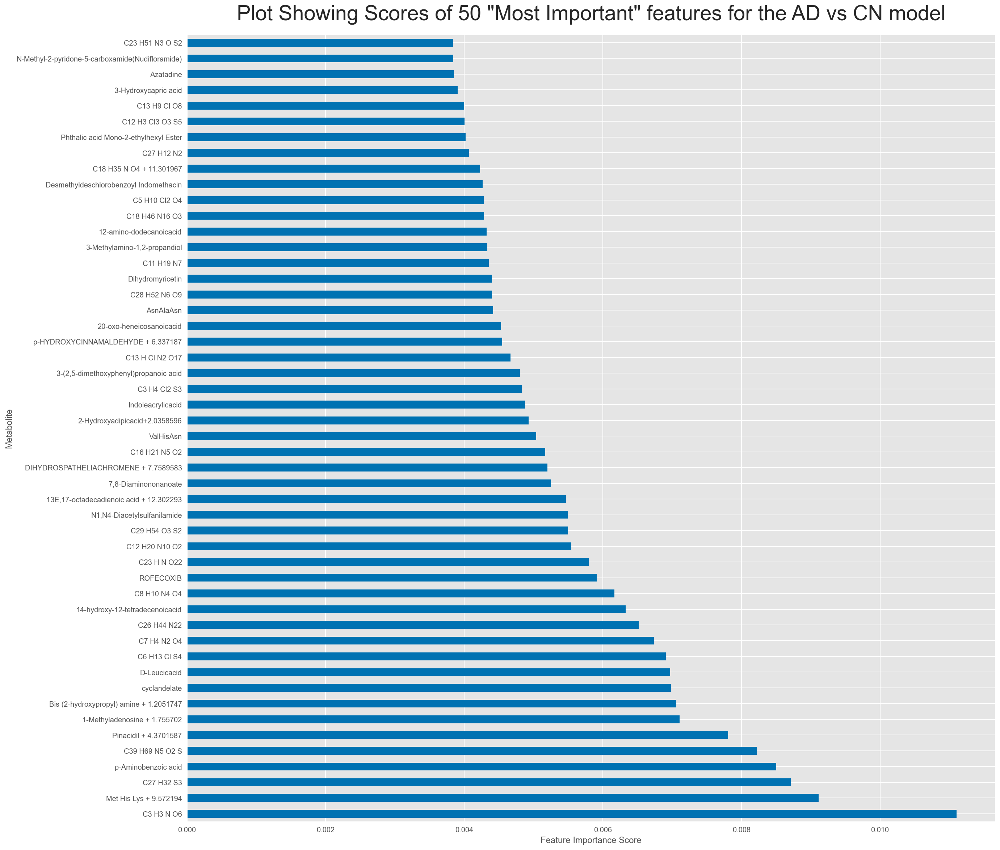

In [111]:
model1 = ExtraTreesClassifier()
model1.fit(X1,Y1)
print(model1.feature_importances_) 

#plot the graph of feature importances 
figure(figsize=(20,20))
feat_importances1 = pd.Series(model1.feature_importances_, index=X1.columns)
feat_importances1.nlargest(50).plot(kind='barh')
plt.rc('font', size=20)
plt.xlabel('Feature Importance Score')
plt.ylabel('Metabolite')
plt.title('Plot Showing Scores of 50 "Most Important" features for the AD vs CN model')
plt.show()

In [112]:
feat_importances1
someimport1 = feat_importances1[feat_importances1!=0]
someimport1 = someimport1.sort_values(ascending=False)

In [113]:
someimport1

Unnamed: 0
C3 H3 N O6                    0.011105
Met His Lys + 9.572194        0.009111
C27 H32 S3                    0.008714
p-Aminobenzoic acid           0.008500
C39 H69 N5 O2 S               0.008218
                                ...   
C14 H29 N S2                  0.000414
6-methyltetrahydropterin      0.000356
2-Methylbutyrylglycine        0.000356
C11 H17 Cl3 N2 O8 S5          0.000333
C18 H33 N O3 S + 10.883396    0.000250
Length: 507, dtype: float64

Creating a list of the most important metabolites for AD vs CN

In [114]:
top50_1 = (someimport1[:50])
top50_1

Unnamed: 0
C3 H3 N O6                                          0.011105
Met His Lys + 9.572194                              0.009111
C27 H32 S3                                          0.008714
p-Aminobenzoic acid                                 0.008500
C39 H69 N5 O2 S                                     0.008218
Pinacidil + 4.3701587                               0.007806
1-Methyladenosine + 1.755702                        0.007109
Bis (2-hydroxypropyl) amine + 1.2051747             0.007060
cyclandelate                                        0.006981
D-Leucicacid                                        0.006971
C6 H13 Cl S4                                        0.006909
C7 H4 N2 O4                                         0.006739
C26 H44 N22                                         0.006518
14-hydroxy-12-tetradecenoicacid                     0.006327
C8 H10 N4 O4                                        0.006165
ROFECOXIB                                           0.005909
C23 H N O22  

In [115]:
ls1 = list(top50_1.index.values)

In [116]:
ls1;

Using the list of metabolites (i.e., column names) to build a new X1 dataframe to be used in the logistic regression model

In [117]:
X1_2 = X1[ls1]
X1_2;

Splitting the data for the second model

In [118]:
X_train1_2, X_test1_2, Y_train1_2, Y_test1_2 = train_test_split(X1_2, Y1, random_state=0)

Building the classifier

In [119]:
logclassifier1_2 = LogisticRegression(solver='lbfgs',random_state=0)

In [120]:
result1_2=logclassifier1_2.fit(X_train1_2, Y_train1_2)

Testing the classifier

In [121]:
predicted_y1_2 = logclassifier1_2.predict(X_test1_2)

In [122]:
predicted_y1_2

array([1, 0, 1, 1, 0, 0, 0, 1])

Testing the accuracy of the classifier

In [123]:
print('Accuracy: {:.2f}'.format(logclassifier1_2.score(X_test1_2, Y_test1_2)))

Accuracy: 1.00


Cross Validation testing

In [124]:
scores_log1_2 = cross_val_score(logclassifier1_2, X1_2, Y1, cv=15)
print('Cross-Validation Accuracy Scores', scores)

Cross-Validation Accuracy Scores                0          1
(AD,)  -1.222745 -40.377813
(AD,)  46.356504  40.916677
(AD,)  18.692658 -33.797747
(AD,)  30.774476 -12.619730
(AD,)  33.089205  15.232970
(AD,)  31.921989   7.744217
(AD,)   9.920566 -29.751866
(AD,)  10.112452 -28.599485
(AD,)  33.769038  18.265838
(AD,)  13.173233 -40.520193
(AD,)  16.330996  -8.029804
(AD,)  19.061220   2.108904
(AD,)  13.947946 -25.916051
(AD,)  20.300494 -15.522349
(AD,)  34.283022  34.320009
(CN,)  -7.033862  24.474461
(CN,) -25.130971  -8.409143
(CN,) -24.545581 -10.462321
(CN,) -21.443017  -3.508386
(CN,)  -4.216658  28.850970
(CN,) -23.963983  -6.578610
(CN,) -28.921526 -12.141890
(CN,) -26.137046  -3.950379
(CN,) -31.776560  -6.616078
(CN,) -16.546567  12.282010
(CN,) -27.103794  25.613816
(CN,) -22.851954  11.700331
(CN,) -22.666756   5.066427
(CN,) -27.646188  19.798676
(CN,) -20.526589  40.426541


In [125]:
scores_log1_2 = pd.Series(scores_log1_2)
scores_log1_2.min(), scores_log1_2.mean(), scores_log1_2.max()

(0.5, 0.9333333333333333, 1.0)

_Range of accuracy is now between 0.5 and 1.0 but averaging on 0.94_

Extracting coefficients of specific metabolites

In [126]:
# Create a list of original variable names from the training DataFrame
original_variables1_2 = X1_2.columns

# Extract the coefficients of the logistic regression estimator
model_coefficients1_2 = logclassifier1_2.coef_[0]

# Create a dataframe of the variables and coefficients & print it out
coefficient_df1_2 = pd.DataFrame({"Metabolite" : original_variables1_2, "Coefficient": model_coefficients1_2})
print(coefficient_df1_2)

# Print out the top 3 positive variables
top_three_df1_2 = coefficient_df1_2.sort_values(by="Coefficient", axis=0, ascending=False)[0:3]
print(top_three_df1_2)

# Print out the bottom 3 positive variables
bottom_three_df1_2 = coefficient_df1_2.sort_values(by="Coefficient", axis=0, ascending=True)[0:3]
print(bottom_three_df1_2)

                                          Metabolite  Coefficient
0                                         C3 H3 N O6    -0.146385
1                             Met His Lys + 9.572194    -0.049869
2                                         C27 H32 S3     0.176010
3                                p-Aminobenzoic acid     0.236046
4                                    C39 H69 N5 O2 S     0.006662
5                              Pinacidil + 4.3701587     0.148419
6                       1-Methyladenosine + 1.755702     0.002006
7            Bis (2-hydroxypropyl) amine + 1.2051747    -0.157478
8                                       cyclandelate    -0.005801
9                                       D-Leucicacid     0.017878
10                                      C6 H13 Cl S4    -0.020576
11                                       C7 H4 N2 O4    -0.029027
12                                       C26 H44 N22     0.143305
13                   14-hydroxy-12-tetradecenoicacid    -0.005422
14        

#### MCI vs CN

Creating a dataframe of only AD and CN Values

_1 values relate to MCI and 0 values relate to CN_

In [127]:
MCI_log = AlzZ.iloc[30:,:]
MCI_log.eval("Cog_Status = Cog_Status - 1", inplace=True)
MCI_log;

In [128]:
MCIvsCN_log = pd.concat([MCI_log, CN_log])
MCIvsCN_log;

Creating a features array

In [129]:
X2 = MCIvsCN_log.iloc[:,1:]
X2;

Creating an output array

In [130]:
Y2 = MCIvsCN_log.iloc[:,0]
Y2;

Splitting the data

In [131]:
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(X2, Y2, random_state=0)

Building the classifier

In [132]:
logclassifier2 = LogisticRegression(solver='lbfgs',random_state=0)

In [133]:
result2=logclassifier2.fit(X_train2, Y_train2)

Testing the classifier

In [134]:
predicted_y2 = logclassifier2.predict(X_test2)

In [135]:
predicted_y2

array([0, 1, 1, 1, 1, 0, 1, 1])

Testing the accuracy of the classifier

In [136]:
print('Accuracy: {:.2f}'.format(logclassifier2.score(X_test2, Y_test2)))

Accuracy: 0.50


Cross Validation testing

In [137]:
scores_log2 = cross_val_score(logclassifier2, X2, Y2, cv=10)
print('Cross-Validation Accuracy Scores', scores)

Cross-Validation Accuracy Scores                0          1
(AD,)  -1.222745 -40.377813
(AD,)  46.356504  40.916677
(AD,)  18.692658 -33.797747
(AD,)  30.774476 -12.619730
(AD,)  33.089205  15.232970
(AD,)  31.921989   7.744217
(AD,)   9.920566 -29.751866
(AD,)  10.112452 -28.599485
(AD,)  33.769038  18.265838
(AD,)  13.173233 -40.520193
(AD,)  16.330996  -8.029804
(AD,)  19.061220   2.108904
(AD,)  13.947946 -25.916051
(AD,)  20.300494 -15.522349
(AD,)  34.283022  34.320009
(CN,)  -7.033862  24.474461
(CN,) -25.130971  -8.409143
(CN,) -24.545581 -10.462321
(CN,) -21.443017  -3.508386
(CN,)  -4.216658  28.850970
(CN,) -23.963983  -6.578610
(CN,) -28.921526 -12.141890
(CN,) -26.137046  -3.950379
(CN,) -31.776560  -6.616078
(CN,) -16.546567  12.282010
(CN,) -27.103794  25.613816
(CN,) -22.851954  11.700331
(CN,) -22.666756   5.066427
(CN,) -27.646188  19.798676
(CN,) -20.526589  40.426541


In [138]:
scores_log2 = pd.Series(scores_log2)
scores_log2.min(), scores_log2.mean(), scores_log2.max()

(0.3333333333333333, 0.5333333333333333, 1.0)

_Range of accuracy is between 0.34 and 1.0 but averaging on 0.54_

Extracting coefficients of specific metabolites

In [139]:
# Create a list of original variable names from the training DataFrame
original_variables2 = X2.columns

# Extract the coefficients of the logistic regression estimator
model_coefficients2 = logclassifier2.coef_[0]

# Create a dataframe of the variables and coefficients & print it out
coefficient_df2 = pd.DataFrame({"Metabolite" : original_variables2, "Coefficient": model_coefficients2})
print(coefficient_df2)

# Print out the top 3 positive variables
top_three_df2 = coefficient_df2.sort_values(by="Coefficient", axis=0, ascending=False)[0:3]
print(top_three_df2)

# Print out the bottom 3 positive variables
bottom_three_df2 = coefficient_df2.sort_values(by="Coefficient", axis=0, ascending=True)[0:3]
print(bottom_three_df2)

                                             Metabolite  Coefficient
0                         10_12_15-octadecatrienoicacid     0.000074
1     (10E)-19-fluorovitaminD3/(10E)-19-fluorocholec...    -0.000126
2            10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid    -0.000250
3     10-hydroxy-2E_8E-Decadiene-4_6-diynoicacid+1.2...    -0.000326
4                     1-(11E-octadecenoyl)-rac-glycerol    -0.000069
...                                                 ...          ...
1904            GPGro(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))     0.000168
1905                   GPIns(16:0/18:1(9Z)) + 14.261185     0.004545
1906                               GPIns(16:0/18:1(9Z))    -0.000312
1907                                      C22 Sulfatide     0.000665
1908                                 C24:1-OH Sulfatide     0.000050

[1909 rows x 2 columns]
                                  Metabolite  Coefficient
1422                             Lys Lys Met     0.040013
1841                           

Feature Selection to improve the model

[0.         0.         0.         ... 0.00106667 0.         0.        ]


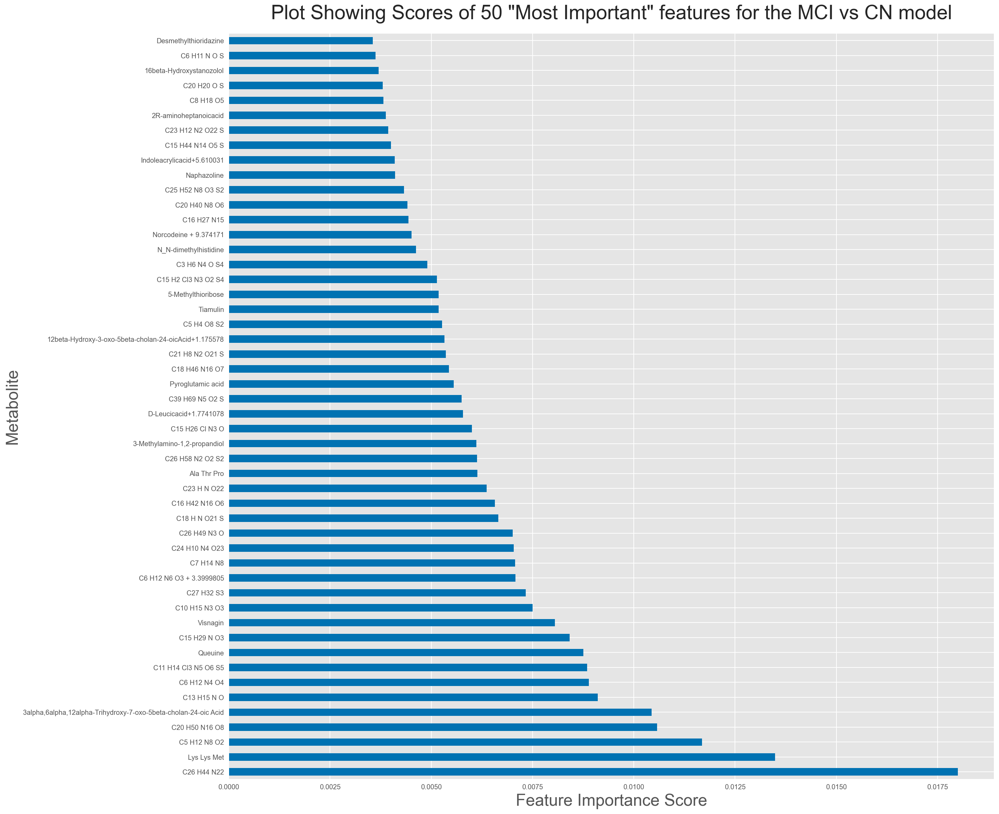

In [140]:
model2 = ExtraTreesClassifier()
model2.fit(X2,Y2)
print(model2.feature_importances_) 

#plot the graph of feature importances 
figure(figsize=(20,20))
feat_importances2 = pd.Series(model2.feature_importances_, index=X2.columns)
feat_importances2.nlargest(50).plot(kind='barh')
plt.rc('font', size=20)
plt.xlabel('Feature Importance Score')
plt.ylabel('Metabolite')
plt.title('Plot Showing Scores of 50 "Most Important" features for the MCI vs CN model')
plt.show()

In [141]:
feat_importances2
someimport2 = feat_importances2[feat_importances2!=0]
someimport2 = someimport2.sort_values(ascending=False)

In [142]:
someimport2

Unnamed: 0
C26 H44 N22                                                        0.018000
Lys Lys Met                                                        0.013490
C5 H12 N8 O2                                                       0.011687
C20 H50 N16 O8                                                     0.010578
3alpha,6alpha,12alpha-Trihydroxy-7-oxo-5beta-cholan-24-oic Acid    0.010439
                                                                     ...   
C13 H5 Cl3 O12 S4                                                  0.000342
1-Phenyl-2-(ethylamino)-1-propanol                                 0.000333
C16 H35 N O10                                                      0.000323
C30 H35 N7 O2                                                      0.000323
Indoleacrylicacid                                                  0.000323
Length: 528, dtype: float64

Creating a list of the most important metabolites for MCI vs CN

In [143]:
top50_2 = (someimport2[:50])
top50_2

Unnamed: 0
C26 H44 N22                                                        0.018000
Lys Lys Met                                                        0.013490
C5 H12 N8 O2                                                       0.011687
C20 H50 N16 O8                                                     0.010578
3alpha,6alpha,12alpha-Trihydroxy-7-oxo-5beta-cholan-24-oic Acid    0.010439
C13 H15 N O                                                        0.009111
C6 H12 N4 O4                                                       0.008894
C11 H14 Cl3 N5 O6 S5                                               0.008851
Queuine                                                            0.008754
C15 H29 N O3                                                       0.008413
Visnagin                                                           0.008049
C10 H15 N3 O3                                                      0.007502
C27 H32 S3                                                         0.007330
C

In [144]:
ls2 = list(top50_2.index.values)

In [145]:
ls2;

Using the list of metabolites (i.e., column names) to build a new X2 dataframe to be used in the logistic regression model

In [146]:
X2_2 = X2[ls2]
X2_2;

Splitting the data for the second model

In [147]:
X_train2_2, X_test2_2, Y_train2_2, Y_test2_2 = train_test_split(X2_2, Y2, random_state=0)

Building the classifier

In [148]:
logclassifier2_2 = LogisticRegression(solver='lbfgs',random_state=0)

In [149]:
result2_2=logclassifier2_2.fit(X_train2_2, Y_train2_2)

Testing the classifier

In [150]:
predicted_y2_2 = logclassifier2_2.predict(X_test2_2)

In [151]:
predicted_y2_2

array([1, 0, 1, 1, 0, 0, 0, 1])

Testing the accuracy of the classifier

In [152]:
print('Accuracy: {:.2f}'.format(logclassifier2_2.score(X_test2_2, Y_test2_2)))

Accuracy: 1.00


Cross Validation testing

In [153]:
scores_log2_2 = cross_val_score(logclassifier2_2, X2_2, Y2, cv=15)
print('Cross-Validation Accuracy Scores', scores)

Cross-Validation Accuracy Scores                0          1
(AD,)  -1.222745 -40.377813
(AD,)  46.356504  40.916677
(AD,)  18.692658 -33.797747
(AD,)  30.774476 -12.619730
(AD,)  33.089205  15.232970
(AD,)  31.921989   7.744217
(AD,)   9.920566 -29.751866
(AD,)  10.112452 -28.599485
(AD,)  33.769038  18.265838
(AD,)  13.173233 -40.520193
(AD,)  16.330996  -8.029804
(AD,)  19.061220   2.108904
(AD,)  13.947946 -25.916051
(AD,)  20.300494 -15.522349
(AD,)  34.283022  34.320009
(CN,)  -7.033862  24.474461
(CN,) -25.130971  -8.409143
(CN,) -24.545581 -10.462321
(CN,) -21.443017  -3.508386
(CN,)  -4.216658  28.850970
(CN,) -23.963983  -6.578610
(CN,) -28.921526 -12.141890
(CN,) -26.137046  -3.950379
(CN,) -31.776560  -6.616078
(CN,) -16.546567  12.282010
(CN,) -27.103794  25.613816
(CN,) -22.851954  11.700331
(CN,) -22.666756   5.066427
(CN,) -27.646188  19.798676
(CN,) -20.526589  40.426541


In [154]:
scores_log2_2 = pd.Series(scores_log2_2)
scores_log2_2.min(), scores_log2_2.mean(), scores_log2_2.max()

(0.5, 0.9, 1.0)

_Range of accuracy is now between 0.5 and 1.0 but averaging on 0.9_

Extracting coefficients of specific metabolites

In [155]:
# Create a list of original variable names from the training DataFrame
original_variables2_2 = X2_2.columns

# Extract the coefficients of the logistic regression estimator
model_coefficients2_2 = logclassifier2_2.coef_[0]

# Create a dataframe of the variables and coefficients & print it out
coefficient_df2_2 = pd.DataFrame({"Metabolite" : original_variables2_2, "Coefficient": model_coefficients2_2})
print(coefficient_df2_2)

# Print out the top 3 positive variables
top_three_df2_2 = coefficient_df2_2.sort_values(by="Coefficient", axis=0, ascending=False)[0:3]
print(top_three_df2_2)

# Print out the bottom 3 positive variables
bottom_three_df2_2 = coefficient_df2_2.sort_values(by="Coefficient", axis=0, ascending=True)[0:3]
print(bottom_three_df2_2)

                                           Metabolite  Coefficient
0                                         C26 H44 N22     0.115598
1                                         Lys Lys Met     0.158035
2                                        C5 H12 N8 O2    -0.165240
3                                      C20 H50 N16 O8     0.102969
4   3alpha,6alpha,12alpha-Trihydroxy-7-oxo-5beta-c...     0.013198
5                                         C13 H15 N O     0.235669
6                                        C6 H12 N4 O4     0.089426
7                                C11 H14 Cl3 N5 O6 S5     0.039489
8                                             Queuine    -0.037536
9                                        C15 H29 N O3     0.096337
10                                           Visnagin     0.172322
11                                      C10 H15 N3 O3    -0.166148
12                                         C27 H32 S3     0.136151
13                           C6 H12 N6 O3 + 3.3999805    -0.34